<a href="https://colab.research.google.com/github/snvssk/data255/blob/main/YOLOv5_FashionDetect_epoch100.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Step 1: Install Requirements for YoloV5

In [ ]:
#clone YOLOv5 and install
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
import glob
from IPython.display import Image, display
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 13435, done.
remote: Counting objects: 100% (21/21), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 13435 (delta 13), reused 3 (delta 2), pack-reused 13414
Receiving objects: 100% (13435/13435), 12.05 MiB | 23.88 MiB/s, done.
Resolving deltas: 100% (9373/9373), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.4 MB/s 
     |████████████████████████████████| 145 kB 5.1 MB/s 
     |████████████████████████████████| 178 kB 49.5 MB/s 
     |████████████████████████████████| 1.1 MB 55.4 MB/s 
     |████████████████████████████████| 67 kB 5.9 MB/s 
     |████████████████████████████████| 54 kB 3.0 MB/s 
     |████████████████████████████████| 138 kB 58.1 MB/s 
     |████████████████████████████████| 63 kB 1.8 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-co

# Step 2: Download Our Dataset from Roboflow

We have transformed and prepared our dataset in roboflow and can be downloaded using the key provided by them.





In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# Downloading dataset to local notebook
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
!pip install roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="gZ889YZoIUvo6Bvc6lsU")
project = rf.workspace("sjsu").project("bounding-box-oofsu")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/bounding-box-1 in yolov5pytorch:: 100%|██████████| 1802/1802 [00:01<00:00, 1258.66it/s]


# Step 3: Train YOLOv5 model for 

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
#Training with YoloV5x  weights , batch size of 4, 100 epochs and image size of 416 X 416 and cache 

!python train.py --img 416 --batch 4 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/yolov5x.yaml --weights yolov5x.pt --name yolov5x_clothing --cache

train: weights=yolov5x.pt, cfg=./models/yolov5x.yaml, data=/content/datasets/bounding-box-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=4, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5x_clothing, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-195-gb52fd48 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=

# Evaluate YOLOv5 Fashion Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile. we are using mAP for evaluation. more details on  mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
#Testing the model with weights generated from training the model
!python detect.py --weights runs/train/yolov5x_clothing/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/yolov5x_clothing/weights/best.pt'], source=/content/datasets/bounding-box-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-195-gb52fd48 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
YOLOv5x summary: 444 layers, 86247433 parameters, 0 gradients, 204.2 GFLOPs
image 1/90 /content/datasets/bounding-box-1/test/images/000015_jpg.rf.84564ef426b3f0ea3b4866f379f6fe76.jpg: 416x416 1 long sleeve top, 1 short sleeve top, Done. (0.022s)
image 2/90 /content/datasets/bounding-box-1/test/images/000020_jpg.rf.4dd944c5ab1614131bf7e84c3dea6676.jpg: 416x416 1 short sleeve top, D

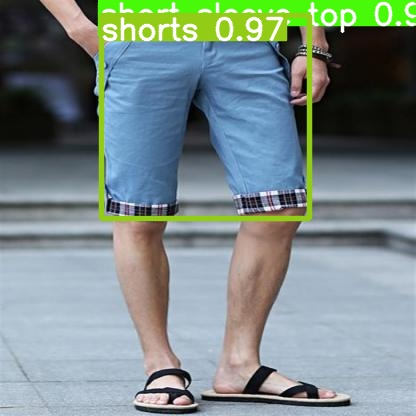

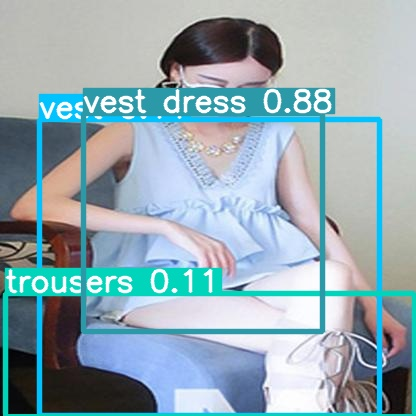

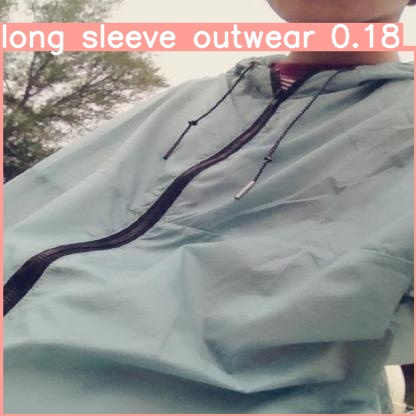

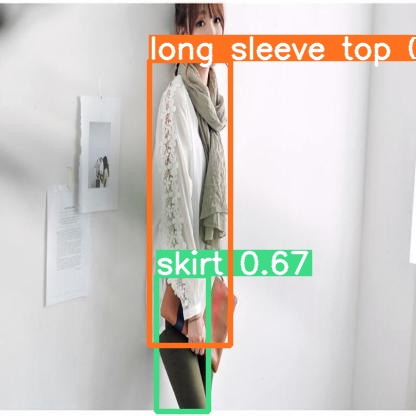

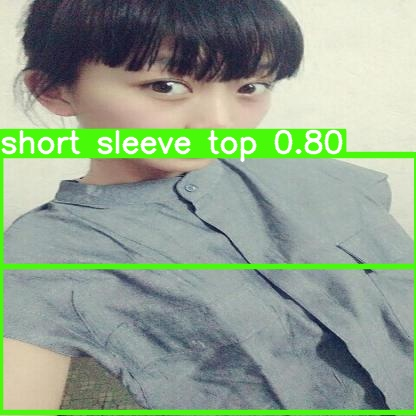

...

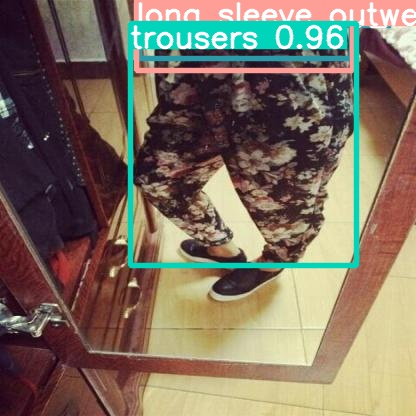

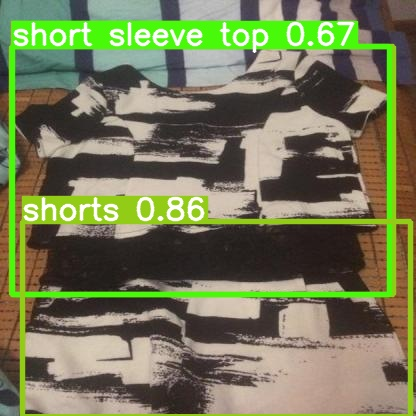

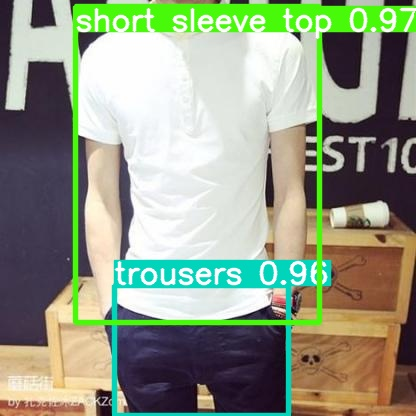

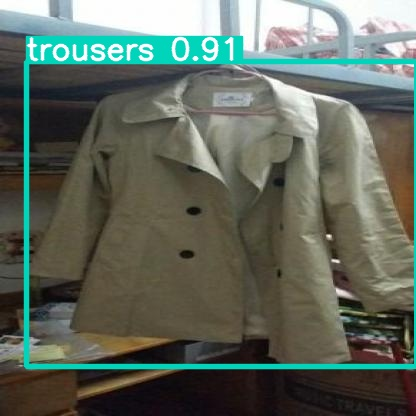

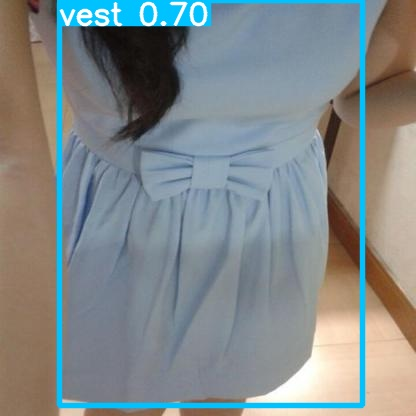

In [ ]:
#Exporting model Weights
from google.colab import drive
drive.mount('/content/drive')

for testImage in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG

  display(Image(filename=testImage))
 

Mounted at /content/drive


In [ ]:
!cp runs/train/yolov5x_clothing/weights/best.pt /content/drive/Shareddrives/DATA-255/DeepFashion2/Trained_Weights/epoch100_best.pt


